![data cube logo](https://static.wixstatic.com/media/8959d6_a13dc7ece5be4678af57c8f7c1667734~mv2.png/v1/fill/w_279,h_177,al_c,q_85,usm_0.66_1.00_0.01,enc_auto/VSDC_DataCubeSplash_6Partner_edited.png)
# Dasymetic Mapping with Areal Interpolation - County Based Example

- Sign up to the [VA Datacube](https://www.data4va.org/) to run this notebook interactively from a browser.

- <b>Products used</b>:
    - Census Survey from U.S. Census Bureau - Census Block Level
    - OpenStreetMap
    - National Land Cover Database from U.S. Geological Survey - Loaded from VA Datacube 
    
- <b>Special requirements:</b> 
    A python code, join_donuts.py is applied in this notebook, please make sure to include it in the directory. 
 
- <b>Notebook Use:</b> If you would like to modify and save this notebook, please copy and paste it into your own folder on the data cube.

# Background

The goal of this notebook is to conduct dasymetric mapping in Virginia.

Dasymetric mapping is a technique used to improve the accuracy of population mapping. In the United States, census data is widely used to analyze the spatial distribution of socio-economic factors. For instance, the American Community Survey (ACS, available at https://www.census.gov/programs-surveys/acs) compiles crucial socio-economic data at the census tract level. While census boundaries cover entire states, the population is not evenly distributed but tends to concentrate in residential areas. Dasymetric mapping, in combination with other datasets like land use and land cover, enhances the precision of mapping results.

This notebook applies python packages:
- Tobler, a geostatistic pytho package based on PySAL: https://github.com/pysal/tobler.

The steps are as follows:
1. Load census block data.
2. Load Openstreetmap residential landuse data.
3. Load Land use land cover data from VA Data Cube.
4. Apply Tobler function to do dasymetric mapping.


In [1]:
# Import Data Cube related library
import datacube
from deafrica_tools.plotting import rgb, display_map

# Import required python library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap # for land use land cover plotting

# GeoSpatial related
import geopandas as gpd
from census import Census

# Census and OpenStreetMap related
#import pygeoda
from pygris import blocks
from pygris.data import get_census
import osmnx as ox

# Geospatial data process & analysis related
import rioxarray
from rasterio.plot import show
from shapely.geometry import Polygon, LineString, Point
from split_donuts import split_donuts # This function require the split_donuts.py in local folder
from join_donuts import join_donuts # This function require the join_donuts.py in local folder
from tobler.util import h3fy

# Geostatistic for dasymetric mapping 
import pysal
from tobler.area_weighted import area_interpolate
from tobler.dasymetric import masked_area_interpolate


# 1. Loading population data from the U.S. Census Bureau

There are several python package can be used to import data from U.S. Census Bureau. Here, pygris is utilized to retrieve Census Bureau TIGER/Line and cartographic boundary shapefiles and load them into Python as GeoDataFrames. For more infromation, see: https://walker-data.com/pygris/

In [2]:
# Define AOI based on city or county name
# Note: if the county name is similar (e.g., Hampton, Southampton, Northampton) data might not load properly
AdminAOI = 'Suffolk' # Here you can assign the name for county

# Load census block group data with pygris "block_groups" function as a GeoDataFrame
cblock = blocks(state = "VA", county = AdminAOI, year = 2020, cache = True)
cblock = cblock.reset_index(drop=True)
FIPS = cblock.loc[0, 'COUNTYFP20']

Using FIPS code '51' for input 'VA'
Using FIPS code '800' for input 'Suffolk'


In [3]:
# Make an interactive map to view the GeoDataFrame
cblock.explore(tooltip = False, popup = True ) #shows data when clicking

In [4]:
# Create a boundary "AOI" for study area for later process
AOI = cblock.copy()
AOI['disso'] = 1
AOI = AOI.dissolve(by='disso')

In [5]:
# Define county code based on FIPS  
county = "county:" + FIPS

# Import census data, here census block data is first retrieved
block_data = get_census(
    dataset = "dec/dhc", # Decennial Census & Census Demographic and Housing Characteristics
    year = 2020,
    variables = ["P1_001N", # total population
                 "P5_003N", # total non-Hispanic white population
                 "P10_004N", #total population of African American
                 "P12_020N", # Variables P12_020N to P12_025N are total population for males ages 65 and over
                 "P12Z_003N", # males under 5 years old
                 "P12_021N",
                 "P12_022N",
                 "P12_023N",
                 "P12_024N",
                 "P12_025N",
                 "P12_044N", # Variables P12_044N to P12_049N are total population for females ages 65 and over
                 "P12_045N",
                 "P12_046N",
                 "P12_047N",
                 "P12_048N",
                 "P12_049N",
                 "P12Z_027N" # females under 5 years old
                ],
    params = {
        "for": "block:*",
        "in": ["state:51", county ] # here define the State / County code, CPC code as 
    },
    return_geoid = True,
    guess_dtypes = True
)

# Preview census data
block_data.head()

,P1_001N,P5_003N,P10_004N,P12_020N,P12Z_003N,P12_021N,P12_022N,P12_023N,P12_024N,P12_025N,P12_044N,P12_045N,P12_046N,P12_047N,P12_048N,P12_049N,P12Z_027N,GEOID
0,51,20,25,3,0,1,0,0,0,0,0,1,0,1,1,0,0,518000654013001
1,35,5,26,0,0,0,0,1,1,0,0,0,1,0,0,0,0,518000654012011
2,21,3,18,0,0,0,0,0,0,0,2,0,0,1,3,0,0,518000654012012
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,518000654013000
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,518000654013002


In [6]:
# Merge population data to the CPC GeoDataframe
Geodf = cblock[['GEOID20', 'geometry', 'ALAND20']].merge(block_data, left_on = "GEOID20", right_on = "GEOID")

# Preview the outcome table
Geodf.head()

,GEOID20,geometry,ALAND20,P1_001N,P5_003N,P10_004N,P12_020N,P12Z_003N,P12_021N,P12_022N,...,P12_024N,P12_025N,P12_044N,P12_045N,P12_046N,P12_047N,P12_048N,P12_049N,P12Z_027N,GEOID
0,518000753013001,"POLYGON ((-76.50246 36.89858, -76.50011 36.899...",104116,38,17,12,0,0,1,2,...,0,0,2,5,2,0,0,0,0,518000753013001
1,518000756021019,"POLYGON ((-76.61107 36.63733, -76.61053 36.637...",3090356,60,43,3,0,0,1,0,...,1,0,1,0,1,0,4,3,0,518000756021019
2,518000758022017,"POLYGON ((-76.79021 36.60087, -76.78840 36.601...",113489,25,22,0,0,0,0,0,...,1,0,0,3,0,0,0,0,0,518000758022017
3,518000757031012,"POLYGON ((-76.61495 36.64378, -76.61490 36.644...",21543,5,0,5,0,0,0,0,...,2,0,0,0,1,0,0,0,0,518000757031012
4,518000652002011,"POLYGON ((-76.58825 36.74340, -76.58814 36.743...",21827,27,23,0,1,0,0,7,...,0,0,0,0,0,0,0,2,0,518000652002011


In [7]:
# Calculate population density, unit of ALAND20 is square meter
Geodf["pop_density"] = Geodf["P1_001N"] / Geodf["ALAND20"]

# Calculate percentage of African American
Geodf["percent_AA"] = Geodf["P10_004N"] / Geodf["P1_001N"] 

# Calculate total population including and above 65 years old
Geodf["senior_pop"] = Geodf["P12_020N"] + Geodf["P12_021N"] + Geodf["P12_022N"] + Geodf["P12_023N"] + Geodf["P12_024N"] + Geodf["P12_025N"] + Geodf["P12_044N"] + Geodf["P12_045N"] + Geodf["P12_046N"] + Geodf["P12_047N"] + Geodf["P12_048N"]

# Calculate medically fragile population of less than 5 years and older than 65 years for males and females of all races
Geodf["med_frag_pop"] = Geodf["P12_020N"] + Geodf["P12_021N"] + Geodf["P12_022N"] + Geodf["P12_023N"] + Geodf["P12_024N"] + Geodf["P12_025N"] + Geodf["P12_044N"] + Geodf["P12_045N"] + Geodf["P12_046N"] + Geodf["P12_047N"] + Geodf["P12_048N"] + Geodf["P12Z_027N"] + Geodf["P12Z_003N"]

# replace 0's with NAs
Geodf.fillna(0, inplace = True)

# remove block with zero land area and zero population
Geodf = Geodf[Geodf.ALAND20 != 0]
Geodf = Geodf[Geodf.P1_001N != 0] 

# reproject to UTM coordinate system
Geodf = Geodf.to_crs("epsg:32618")

# Preview data frame
Geodf.head()

,GEOID20,geometry,ALAND20,P1_001N,P5_003N,P10_004N,P12_020N,P12Z_003N,P12_021N,P12_022N,...,P12_046N,P12_047N,P12_048N,P12_049N,P12Z_027N,GEOID,pop_density,percent_AA,senior_pop,med_frag_pop
0,518000753013001,"POLYGON ((366135.537 4084675.883, 366345.074 4...",104116,38,17,12,0,0,1,2,...,2,0,0,0,0,518000753013001,0.000365,0.315789,12,12
1,518000756021019,"POLYGON ((355969.621 4055850.236, 356017.558 4...",3090356,60,43,3,0,0,1,0,...,1,0,4,3,0,518000756021019,0.000019,0.050000,8,8
2,518000758022017,"POLYGON ((339877.863 4052088.514, 340040.813 4...",113489,25,22,0,0,0,0,0,...,0,0,0,0,0,518000758022017,0.000220,0.000000,5,5
3,518000757031012,"POLYGON ((355635.206 4056571.505, 355641.556 4...",21543,5,0,5,0,0,0,0,...,1,0,0,0,0,518000757031012,0.000232,1.000000,3,3
4,518000652002011,"POLYGON ((358205.367 4067583.273, 358216.066 4...",21827,27,23,0,1,0,0,7,...,0,0,0,2,0,518000652002011,0.001237,0.000000,8,8


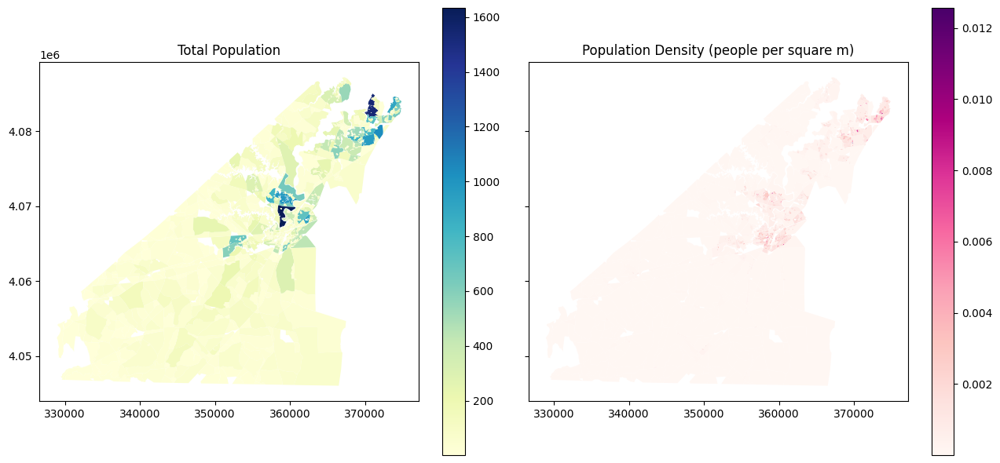

In [8]:
# Plot census block data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 6), sharex=True, sharey=True)

ax1 = Geodf.plot(ax=ax1, column = 'P1_001N', legend=True, 
                   linewidth=0, cmap='YlGnBu')
ax1.set_title("Total Population")
ax2 = Geodf.plot(ax=ax2, column = 'pop_density', legend=True, 
                   linewidth=0, cmap='RdPu')
ax2.set_title("Population Density (people per square m)")
plt.tight_layout()

## 2. Load OpenStreetMap data for the residential area.

OpenStreetMap (OSM) is a collaborative, open-source mapping project. With a global community of contributors, OSM provides a free and constantly evolving map of the world. The python library, osmnx, can be applied to retrieve residential area, which represents an area of land having predominantly residential buildings such as houses or apartment buildings.

For more information about:
- osmnx python library: https://osmnx.readthedocs.io/en/stable/
- OSM residential area: https://wiki.openstreetmap.org/wiki/Tag:landuse%3Dresidential

In [9]:
# Load OpenStreetMap (OSM) data for City of Chesapeake
ox_area =  AdminAOI + ",Virginia"
ox_resi = ox.features.features_from_place (ox_area, tags={'landuse':'residential'})

# Keep Polygon and MultiPolygon part of data
ox_resi = ox_resi.loc[(ox_resi.geometry.type=='Polygon')|(ox_resi.geometry.type=='MultiPolygon')] 

# Convert to UTM coordinate system
ox_resi = ox_resi.to_crs("epsg:32618")

Next, hexagons are created to cover the OSM residential area. This enable the deasymtric tool to conduct interpolation with smaller maping units. The h3fy from Tobler library is applied here. Note, the larger the resolution number, the smaller the hexagons.

In [10]:
# Create hexagons using Tobler h3fy function
ox_resi_hex = h3fy(ox_resi, resolution=11)

/opt/tljh/user/lib/python3.9/site-packages/pyproj/crs/crs.py:1286: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


To make sure all of the hexagons are inside the boundary of City of Chesapeake, remove the hexagons not intersected with the AOI boundary.

In [11]:
AOI = AOI.to_crs("epsg:32618")

# Keep hexagons inside the area of interest created in section 1.1
AOI_hex = gpd.sjoin(ox_resi_hex, AOI, predicate='intersects', how='inner')
AOI_hex = AOI_hex[['geometry']] 

# Plot to see the hexagons
AOI_hex.explore(tooltip = False, popup = True )

## 3. Load land use and land cover data from the National Land Cover Database

The National Land Cover Database (NLCD) offers comprehensive land cover and land use data for the entire United States. If you'd like to learn more about NLCD, you can visit their website here: https://www.usgs.gov/centers/eros/science/national-land-cover-database

The 2019 NLCD for Chesapeake City is load from VA Data Cube and plotted.

In [12]:
# Define datacube and area of interest
dc = datacube.Datacube(app='Dasymap_tobler')

# Define a boundary to load data
AOI = AOI.to_crs("epsg:4326") # get lat/long boundary info
AOI_boundary = AOI.total_bounds
lat_range = (AOI_boundary[1],AOI_boundary[3])
lon_range = (AOI_boundary[0],AOI_boundary[2])

# Make a quitck plot to show the AOI boundary
display_map(lon_range, lat_range)

/opt/tljh/user/lib/python3.9/site-packages/deafrica_tools/plotting.py:284: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  all_longitude, all_latitude = transform(Proj(crs), Proj("EPSG:4326"), all_x, all_y)


In [13]:
# Load nlcd from VA DataCube
query = {
    "y": lat_range,
    "x": lon_range,
    #"time": time_range,
}

lc = dc.load(
    product= "usgs_nlcd", #"io_lulc"
    output_crs="epsg:32618", # UTM 18N
    resolution=(-30, 30),
    **query,
    skip_broken_datasets=True
)

# Print available years for the nlcd data
lc.coords["time"]

<frozen importlib._bootstrap>:228: RuntimeWarning: numpy.ndarray size changed, may indicate binary incompatibility. Expected 16 from C header, got 96 from PyObject


<xarray.DataArray 'time' (time: 9)>
array(['2001-10-07T12:00:00.000000000', '2004-10-07T12:00:00.000000000',
       '2006-10-07T12:00:00.000000000', '2008-10-07T12:00:00.000000000',
       '2011-10-07T12:00:00.000000000', '2013-10-07T12:00:00.000000000',
       '2016-10-07T12:00:00.000000000', '2019-10-07T12:00:00.000000000',
       '2021-10-07T12:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time         (time) datetime64[ns] 2001-10-07T12:00:00 ... 2021-10-07T12:...
    spatial_ref  int32 32618
Attributes:
    units:    seconds since 1970-01-01 00:00:00

In [14]:
lc2d = lc.isel(time=7) # this call 2019 nlcd data
lc2d

<xarray.Dataset>
Dimensions:         (y: 1475, x: 1608)
Coordinates:
    time            datetime64[ns] 2019-10-07T12:00:00
  * y               (y) float64 4.09e+06 4.09e+06 ... 4.046e+06 4.046e+06
  * x               (x) float64 3.272e+05 3.272e+05 ... 3.753e+05 3.754e+05
    spatial_ref     int32 32618
Data variables:
    classification  (y, x) uint8 82 82 82 82 82 82 82 ... 90 90 90 90 90 90 90
Attributes:
    crs:           epsg:32618
    grid_mapping:  spatial_ref

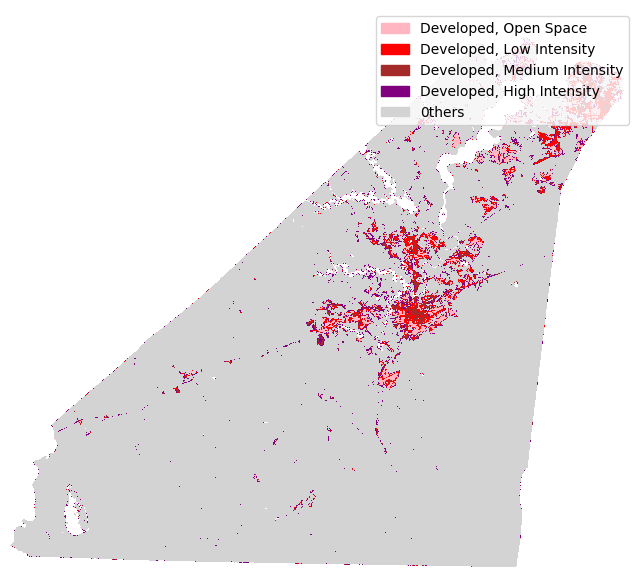

In [15]:
# plot nlcd 2016 data
lc2dAOI = lc2d.rio.clip(AOI.geometry.values, AOI.crs) # clip  the nlcd data to AOI
lc2darray = lc2dAOI.to_array().squeeze() # flat the dimension

# Create a color map and call specific classification for visualization
cmap = ListedColormap(["white", "lightpink", "red", "brown", "purple", "lightgray"])
norm = colors.BoundaryNorm([11, 21, 22, 23, 24, 31, 52], 7) # This define the classes

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(lc2darray, cmap=cmap, norm=norm)
legend_labels = {"lightpink": "Developed, Open Space",  # Create a legend to indicate the land use land cover type
                 "red": "Developed, Low Intensity", 
                 "brown": "Developed, Medium Intensity",
                 "purple": "Developed, High Intensity",
                 "lightgray": "0thers"}
patches = [Patch(color=color, label=label)
           for color, label in legend_labels.items()]
ax.legend(handles=patches, bbox_to_anchor=(1.01, 1), facecolor="white")
ax.set_axis_off() # Not plotting the X and Y becuase imshow does not plot with UTM X and Y values
plt.show()

## 4. Apply Tobler dasymetric mapping methods

Dasymetric mapping aims to focus on residential areas and map where the population resides. We applied the Tobler library for interpolation, which uses data from census tracts, residential areas, and land use land cover data. In Tobler, there are three mapping methods that we will apply and compare:

1. Areal Interpolation (AI): The simplest method for allocating variables based on overlapping geometries.

2. Masked Area Interpolation (MAI): Similar to areal interpolation, this method incorporates auxiliary data (e.g., NLCD) to enhance estimations.

In [16]:
# Save nlcd data as a tif file for Tobler function
lc2darray.rio.to_raster("nlcd_AOI.tif")
nlcd_file = "./nlcd_AOI.tif"

source_ver = "P1_001N" # Here define what source variable to use
source_ver2 = "med_frag_pop"

# Apply Areal Interpolation (AI) method
AI_oxres_totpop = area_interpolate(source_df=Geodf, target_df=AOI_hex, 
                                   extensive_variables=[source_ver])
AI_oxres_totpop = AI_oxres_totpop.rename(columns ={source_ver:"Totpop_AI"})

AI_oxres_mfpop = area_interpolate(source_df=Geodf, target_df=AOI_hex, 
                                   extensive_variables=[source_ver2])
AI_oxres_mfpop = AI_oxres_mfpop.rename(columns ={source_ver2:"mfpop_AI"})


# Apply Masked Areal Interpolation (MAI) method
MAI_oxres_totpop = masked_area_interpolate (source_df=Geodf, target_df=AOI_hex, 
                                            raster=nlcd_file, pixel_values=[21, 22, 23, 24],
                                            extensive_variables=[source_ver])
MAI_oxres_totpop = MAI_oxres_totpop.rename(columns ={source_ver:"Totpop_MAI"})

MAI_oxres_mfpop = masked_area_interpolate (source_df=Geodf, target_df=AOI_hex, 
                                            raster=nlcd_file, pixel_values=[21, 22, 23, 24],
                                            extensive_variables=[source_ver2])
MAI_oxres_mfpop = MAI_oxres_mfpop.rename(columns ={source_ver2:"mfpop_MAI"})


/opt/tljh/user/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/opt/tljh/user/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/opt/tljh/user/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mi

In [17]:
# Save outcomes to shapefiles
#AI_oxres_totpop.to_file("Toblerhex_totpop_AI_" + AdminAOI + ".shp")
#AI_oxres_mfpop.to_file("Toblerhex_mfpop_AI_" + AdminAOI + ".shp")
#MAI_oxres_totpop.to_file("Toblerhex_totpop_MAI_" + AdminAOI + ".shp")
#MAI_oxres_mfpop.to_file("Toblerhex_mfpop_MAI_" + AdminAOI + ".shp")

/tmp/ipykernel_419585/2591092859.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


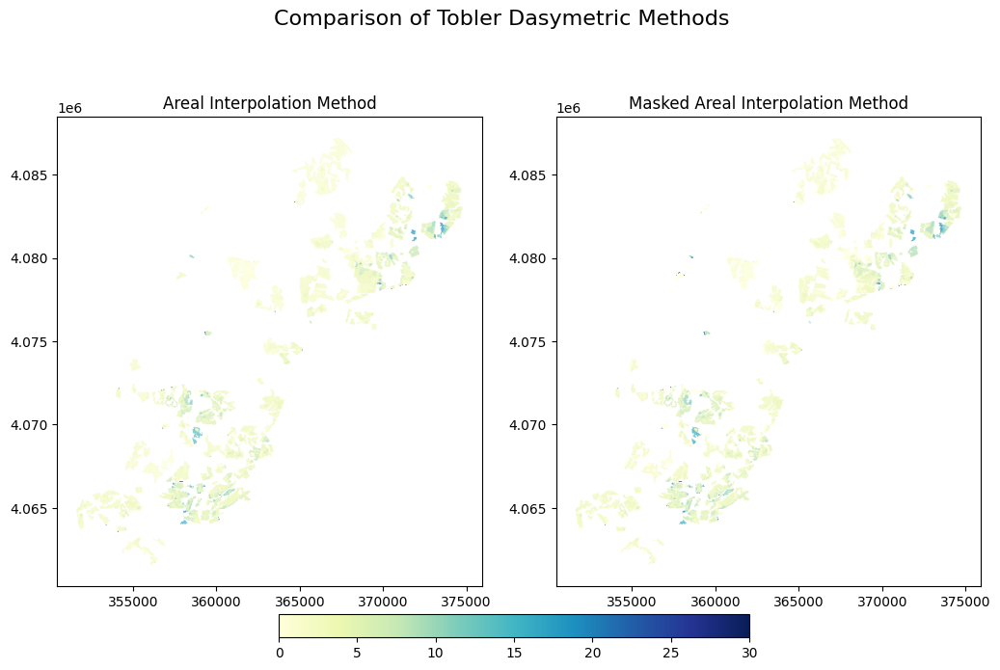

In [18]:
# Make a side-by-side map showing the outcomes
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10.5, 6.5))
fig.suptitle ("Comparison of Tobler Dasymetric Methods",  fontsize=16)

# Define the minimum and maximum values for plotting
vmin = 0
vmax = 30 # set 30 for better visualization

colormap = "YlGnBu"

# Plot Areal Interpolation result
ax[0] = AI_oxres_totpop.plot(ax=ax[0], column = 'Totpop_AI', linewidth=0, vmin=vmin, vmax=vmax, cmap=colormap)
ax[0].set_title("Areal Interpolation Method")

# Plot Masked Areal Interpolation result
ax[1] = MAI_oxres_totpop.plot(ax=ax[1], column = 'Totpop_MAI', linewidth=0, vmin=vmin, vmax=vmax, cmap=colormap)
ax[1].set_title("Masked Areal Interpolation Method")

# Define color bar on the bottom
patch_col = ax[0].collections[0]
cb = fig.colorbar(patch_col, ax=ax, orientation='horizontal', shrink= 0.6, location = "bottom", anchor=(0.5, -1.7))
plt.subplots_adjust(bottom=0.05)
plt.tight_layout()